
# limTOD: consistent real-beam TOD → NSIDE=8 recovery, with and without priors

This notebook is deliberately organised as a clean, single pipeline.

The logic is:

1. Load/plot the raw sky at NSIDE 32 and 64.
2. Build reference maps at NSIDE 8: plain degraded sky, and Gaussian-smoothed degraded skies with FWHM 20° and 40°.
3. Generate a 24 h limTOD TOD from the **raw NSIDE 32 sky** and the **real beam**.
4. Build a matched NSIDE 8 mapmaker operator using the **same beam normalisation** as TOD generation.
5. Run closure tests so we know the operator/solver are internally consistent.
6. Recover maps from the actual high-NSIDE TOD with no prior, ridge regularisation, absolute-K priors, and relative priors.
7. Compare recovered maps against plain, FWHM=20°, and FWHM=40° references.

Important language:

- A **prior mean** is the map the solver is softly pulled toward.
- A **prior sigma** is the allowed uncertainty around that map, in K.
- A relative prior like `0.5` means `sigma_prior ≈ 0.5 × prior_mean`, i.e. a 50% loose prior, not a 0.5 K prior.
- `regularization` is a generic diagonal stabiliser in the matrix solve. It is not a sky model. It damps unstable matrix modes.


## 1. Imports

In [1]:

import os
import re
import glob
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import healpy as hp
from astropy.io import fits

import limTOD
from limTOD import generate_LSTs_deg, generate_TOD_sky, GDSM_sky_model, HPW_mapmaking
from limTOD.simulator import generate_sky2sys_projection

print("limTOD imported from:", limTOD.__file__)


limTOD imported from: /Users/user/LimTOD/rhino-TODsim/limTOD/__init__.py


## 2. One-place configuration

In [24]:

# ============================================================
# CONFIGURATION: edit here, and only here
# ============================================================

FREQ_MHZ = 70.0

TOD_SKY_NSIDE = 32
PLOT_SKY_NSIDE_LIST = [32, 64]
SIM_NSIDE = 32
MAP_NSIDE = 8

FWHM_DEG_LIST = [10.0, 20.0, 40.0]
REFERENCE_FOR_PRIOR = 40.0

# Pick the beam set intentionally. The notebook prints the chosen FITS file.
# BEAM_DIR = Path("~/LimTOD/rhino-TODsim/data/DipoleDry").expanduser()
BEAM_DIR = Path("~/LimTOD/rhino-TODsim/data/HornDry").expanduser()
# BEAM_DIR = Path("~/LimTOD/rhino-TODsim/data/HornWet").expanduser()

ANT_LAT_DEG = 53.2421
ANT_LON_DEG = -2.3067
ANT_HEIGHT_M = 100.0
START_TIME_UTC = "2019-04-23 20:41:56.397"

OBS_HOURS = 24.0
DT_SECONDS = 60.0
N_TIME = int(round(OBS_HOURS * 3600.0 / DT_SECONDS))
AZIMUTH_DEG = 0.0
ELEVATION_DEG = 90.0
ROTATION_PERIOD_HOURS = 1.0

# Keep TOD generation and operator construction matched.
NORMALIZE_BEAM = True
THRESHOLD_SELECT_PIX = 0.05
BEAM_TRUNCATE_FRAC = 0.05

# Solver settings.
NOISE_VARIANCE = 1.0
REG_WEAK = 1e-8       # nearly unregularised; useful for seeing weak modes
REG_RIDGE = 1e-4      # stable no-prior baseline

# Prior settings.
ABSOLUTE_SIGMA_K_LIST = [5000.0, 2000.0, 1000.0, 500.0, 200.0, 100.0]
RELATIVE_SIGMA_FRAC_LIST = [0.5, 0.3]
RELATIVE_SIGMA_FLOOR_K = 300.0

WEIGHTED_HIT_CUTS = [0.0, 0.2, 0.5, 1.0, 2.0]
PLOT_HIT_CUT = 1.0

print("Configuration summary")
for name in [
    "FREQ_MHZ", "TOD_SKY_NSIDE", "SIM_NSIDE", "MAP_NSIDE", "BEAM_DIR", "N_TIME",
    "DT_SECONDS", "NORMALIZE_BEAM", "THRESHOLD_SELECT_PIX", "BEAM_TRUNCATE_FRAC",
    "REG_WEAK", "REG_RIDGE"
]:
    print(f"  {name} =", globals()[name])


Configuration summary
  FREQ_MHZ = 70.0
  TOD_SKY_NSIDE = 32
  SIM_NSIDE = 32
  MAP_NSIDE = 8
  BEAM_DIR = /Users/user/LimTOD/rhino-TODsim/data/HornDry
  N_TIME = 1440
  DT_SECONDS = 60.0
  NORMALIZE_BEAM = True
  THRESHOLD_SELECT_PIX = 0.05
  BEAM_TRUNCATE_FRAC = 0.05
  REG_WEAK = 1e-08
  REG_RIDGE = 0.0001


## 3. Helper functions

In [25]:

# ============================================================
# HELPER FUNCTIONS
# ============================================================

def as_finite_array(x, clip_negative=False):
    arr = np.nan_to_num(np.asarray(x, dtype=float), nan=0.0, posinf=0.0, neginf=0.0)
    if clip_negative:
        arr = np.where(arr < 0.0, 0.0, arr)
    return arr


def get_nside(x):
    return hp.npix2nside(len(np.asarray(x).reshape(-1)))


def finite_percentile(values, q, fallback=0.0):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return fallback
    return float(np.percentile(values, q))


def print_percentiles(name, x):
    x = np.asarray(x, dtype=float)
    p = np.nanpercentile(x, [0, 1, 5, 50, 95, 99, 100])
    print(f"{name:34s}: min/p1/p5/med/p95/p99/max = " + " / ".join(f"{v:.4g}" for v in p))


def plot_map(m, title, unit="K", vmin=None, vmax=None, cmap="viridis", badcolor="gray"):
    hp.mollview(m, title=title, unit=unit, min=vmin, max=vmax, cmap=cmap, badcolor=badcolor)
    hp.graticule()
    plt.show()


def patch_to_full(patch, pix, nside, unseen=hp.UNSEEN):
    full = np.full(hp.nside2npix(nside), unseen, dtype=float)
    full[np.asarray(pix, dtype=int)] = np.asarray(patch, dtype=float).reshape(-1)
    return full


def full_to_patch(full_map, pix):
    return np.asarray(full_map, dtype=float).reshape(-1)[np.asarray(pix, dtype=int)]


def load_gdsm(freq_mhz, nside, clip_negative=False):
    sky = GDSM_sky_model(freq=freq_mhz, nside=nside)
    return as_finite_array(sky, clip_negative=clip_negative)


def simple_degrade_sky(sky, nside_out):
    return as_finite_array(hp.ud_grade(sky, nside_out=nside_out))


def gaussian_degrade_truth_from_sky(sky_source, nside_out, fwhm_deg):
    smoothed = hp.smoothing(np.asarray(sky_source, dtype=float), fwhm=np.radians(fwhm_deg), verbose=False)
    smoothed = as_finite_array(smoothed)
    truth = as_finite_array(hp.ud_grade(smoothed, nside_out=nside_out))
    return smoothed, truth


def find_beam_file(beam_dir, freq_mhz):
    beam_dir = Path(beam_dir).expanduser()
    if not beam_dir.exists():
        raise FileNotFoundError(f"Beam directory does not exist: {beam_dir}")
    fits_files = sorted(glob.glob(str(beam_dir / "*.fits"))) + sorted(glob.glob(str(beam_dir / "*.FITS")))
    if not fits_files:
        raise FileNotFoundError(f"No FITS files found in {beam_dir}")
    target = f"{freq_mhz:.1f}"
    candidates = [f for f in fits_files if target in Path(f).name]
    if len(candidates) == 0:
        target_int = str(int(round(freq_mhz)))
        candidates = [f for f in fits_files if target_int in Path(f).name]
    chosen = candidates[0] if candidates else fits_files[0]
    print("Chosen beam file:", chosen)
    return Path(chosen)


def load_healpix_beam_from_fits(path, target_nside=None):
    data = fits.getdata(path)
    data = np.asarray(data, dtype=float)
    if data.ndim == 1:
        beam = data
    elif data.ndim == 2:
        valid_rows = False
        valid_cols = False
        try:
            hp.npix2nside(data.shape[0]); valid_rows = True
        except Exception:
            pass
        try:
            hp.npix2nside(data.shape[1]); valid_cols = True
        except Exception:
            pass
        if valid_cols:
            beam = data[0]
        elif valid_rows:
            beam = data[:, 0]
        else:
            beam = data.reshape(-1)
    else:
        beam = data.reshape(-1)

    beam = as_finite_array(beam)
    if np.nanmax(np.abs(beam)) <= 0:
        raise ValueError("Beam has non-positive/zero peak.")
    beam = np.where(beam < 0.0, 0.0, beam)
    beam = beam / np.nanmax(beam)

    nside_in = hp.get_nside(beam)
    if target_nside is not None and target_nside != nside_in:
        beam = hp.ud_grade(beam, nside_out=target_nside)
        beam = as_finite_array(beam)
        beam = np.where(beam < 0.0, 0.0, beam)
        beam = beam / np.nanmax(beam)
    return beam


def make_time_and_pointing():
    time_s = np.arange(N_TIME, dtype=float) * DT_SECONDS
    time_h = time_s / 3600.0
    LST_deg_list = generate_LSTs_deg(ANT_LAT_DEG, ANT_LON_DEG, ANT_HEIGHT_M, time_s, start_time_utc=START_TIME_UTC)
    azimuth_deg_list = np.full(N_TIME, AZIMUTH_DEG, dtype=float)
    elevation_deg_list = np.full(N_TIME, ELEVATION_DEG, dtype=float)
    rotation_period_s = ROTATION_PERIOD_HOURS * 3600.0
    selfrot_deg_list = (time_s / rotation_period_s * 360.0) % 360.0
    return time_s, time_h, LST_deg_list, azimuth_deg_list, elevation_deg_list, selfrot_deg_list


def build_mapper_with_matched_operator(beam_map, LST_deg, az_deg, el_deg, selfrot_deg):
    mapper = HPW_mapmaking(
        beam_map=beam_map,
        LST_deg_list_group=LST_deg,
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list_group=az_deg,
        elevation_deg_list_group=el_deg,
        selfrot_deg_list_group=selfrot_deg,
        threshold=THRESHOLD_SELECT_PIX,
        nside_hires=SIM_NSIDE,
        nside_target=MAP_NSIDE,
        beam_truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )
    matched_A = generate_sky2sys_projection(
        beam_map=beam_map,
        LST_deg_list=LST_deg,
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list=az_deg,
        elevation_deg_list=el_deg,
        selfrot_deg_list=selfrot_deg,
        pixel_indices=mapper.pixel_indices,
        nside_hires=SIM_NSIDE,
        nside_target=MAP_NSIDE,
        normalize_beam=NORMALIZE_BEAM,
        truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )
    mapper.Tsys_operators = matched_A
    return mapper


def compute_hitmap_from_operator(A):
    A = np.asarray(A, dtype=float)
    hits = np.sum(np.abs(A) > 0.0, axis=0)
    weighted_hits = np.sum(np.abs(A), axis=0)
    return hits, weighted_hits


def map_metrics(recovered, truth, weighted_hit=None, cut=0.0):
    recovered = np.asarray(recovered, dtype=float).reshape(-1)
    truth = np.asarray(truth, dtype=float).reshape(-1)
    good = np.isfinite(recovered) & np.isfinite(truth)
    if weighted_hit is not None:
        weighted_hit = np.asarray(weighted_hit, dtype=float).reshape(-1)
        good &= np.isfinite(weighted_hit) & (weighted_hit > cut)
    if good.sum() < 3:
        return dict(n_pix=int(good.sum()), rmse=np.nan, bias=np.nan, std=np.nan, corr=np.nan)
    residual = recovered[good] - truth[good]
    corr = np.corrcoef(truth[good], recovered[good])[0, 1]
    return dict(n_pix=int(good.sum()), rmse=float(np.sqrt(np.mean(residual**2))), bias=float(np.mean(residual)), std=float(np.std(residual)), corr=float(corr))


def plot_four_panel(truth_patch, recovered_patch, hit_patch, pix, title, nside=MAP_NSIDE, hit_label="samples"):
    truth_patch = np.asarray(truth_patch, dtype=float).reshape(-1)
    recovered_patch = np.asarray(recovered_patch, dtype=float).reshape(-1)
    residual_patch = recovered_patch - truth_patch
    truth_full = patch_to_full(truth_patch, pix, nside)
    rec_full = patch_to_full(recovered_patch, pix, nside)
    res_full = patch_to_full(residual_patch, pix, nside)
    hit_full = patch_to_full(hit_patch, pix, nside)
    vmin = finite_percentile(truth_patch, 1)
    vmax = finite_percentile(truth_patch, 99)
    rmax = finite_percentile(np.abs(residual_patch), 95, fallback=1.0)
    plt.figure(figsize=(15, 9))
    hp.mollview(truth_full, title=f"{title}: truth", unit="K", min=vmin, max=vmax, sub=(2, 2, 1), badcolor="gray"); hp.graticule()
    hp.mollview(rec_full, title=f"{title}: recovered", unit="K", min=vmin, max=vmax, sub=(2, 2, 2), badcolor="gray"); hp.graticule()
    hp.mollview(res_full, title=f"{title}: recovered - truth", unit="K", min=-rmax, max=rmax, cmap="coolwarm", sub=(2, 2, 3), badcolor="gray"); hp.graticule()
    hp.mollview(hit_full, title=f"{title}: weighted hit", unit=hit_label, sub=(2, 2, 4), badcolor="gray"); hp.graticule()
    plt.show()


def plot_scatter_and_hit(recovered, truth, weighted_hit, title, hit_cut=PLOT_HIT_CUT):
    recovered = np.asarray(recovered, dtype=float).reshape(-1)
    truth = np.asarray(truth, dtype=float).reshape(-1)
    weighted_hit = np.asarray(weighted_hit, dtype=float).reshape(-1)
    residual = recovered - truth
    good = np.isfinite(recovered) & np.isfinite(truth) & np.isfinite(weighted_hit) & (weighted_hit > hit_cut)
    plt.figure(figsize=(6, 6))
    plt.scatter(truth[good], recovered[good], s=18, alpha=0.7)
    lo = np.nanmin([np.nanmin(truth[good]), np.nanmin(recovered[good])])
    hi = np.nanmax([np.nanmax(truth[good]), np.nanmax(recovered[good])])
    plt.plot([lo, hi], [lo, hi], "k--", lw=1)
    plt.xlabel("Reference truth [K]"); plt.ylabel("Recovered [K]")
    plt.title(f"{title}: recovered vs truth, weighted_hit > {hit_cut}")
    plt.grid(alpha=0.3); plt.show()
    plt.figure(figsize=(7, 5))
    plt.scatter(weighted_hit, residual, s=18, alpha=0.7)
    plt.axhline(0.0, color="k", ls="--", lw=1)
    plt.xlabel("Weighted hit = sum(|A|)"); plt.ylabel("Residual [K]")
    plt.title(f"{title}: residual vs weighted hit")
    plt.grid(alpha=0.3); plt.show()


## 4. Load and inspect raw skies

Raw GDSM sky NSIDE=32: min/mean/max = -2736.162 / 2757.634 / 73141.648 K
  Negative pixels: 1 / 12288
Raw GDSM sky NSIDE=64: min/mean/max = -9922.873 / 2757.634 / 192826.422 K
  Negative pixels: 5 / 49152


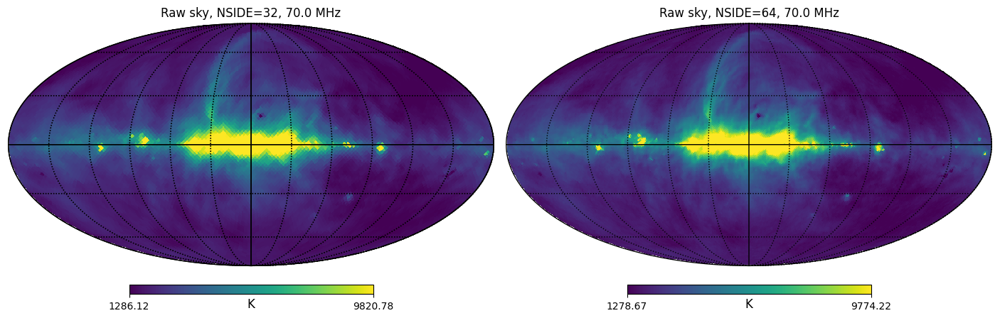

In [26]:

raw_skies = {}
for nside in PLOT_SKY_NSIDE_LIST:
    sky = load_gdsm(FREQ_MHZ, nside, clip_negative=False)
    raw_skies[nside] = sky
    print(f"Raw GDSM sky NSIDE={nside}: min/mean/max = {sky.min():.3f} / {sky.mean():.3f} / {sky.max():.3f} K")
    print(f"  Negative pixels: {np.sum(sky < 0)} / {sky.size}")

sky_nside32 = raw_skies[TOD_SKY_NSIDE]

plt.figure(figsize=(14, 5))
for j, nside in enumerate(PLOT_SKY_NSIDE_LIST, start=1):
    sky = raw_skies[nside]
    hp.mollview(sky, title=f"Raw sky, NSIDE={nside}, {FREQ_MHZ:.1f} MHz", unit="K", min=finite_percentile(sky, 2), max=finite_percentile(sky, 98), sub=(1, 2, j), badcolor="gray")
    hp.graticule()
plt.show()

if np.any(sky_nside32 < 0):
    print("WARNING: raw NSIDE=32 sky contains negative pixels. We do not clip them by default, but this should be checked before physical interpretation.")


## 5. Build NSIDE=8 reference maps: plain, FWHM=20°, FWHM=40°

plain NSIDE32->8                  : min/p1/p5/med/p95/p99/max = 1182 / 1265 / 1399 / 2147 / 6312 / 1.216e+04 / 2.007e+04

Gaussian reference FWHM=10 deg
truth NSIDE8                      : min/p1/p5/med/p95/p99/max = 1237 / 1296 / 1415 / 2166 / 6433 / 1.124e+04 / 1.497e+04

Gaussian reference FWHM=20 deg
truth NSIDE8                      : min/p1/p5/med/p95/p99/max = 1315 / 1361 / 1464 / 2209 / 6352 / 9527 / 1.081e+04

Gaussian reference FWHM=40 deg
truth NSIDE8                      : min/p1/p5/med/p95/p99/max = 1487 / 1523 / 1607 / 2318 / 5722 / 6988 / 7337


/var/folders/y0/4z9tprvs2qb6qwgklyjc_tbw0000gp/T/ipykernel_53414/2831234402.py:56: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smoothed = hp.smoothing(np.asarray(sky_source, dtype=float), fwhm=np.radians(fwhm_deg), verbose=False)


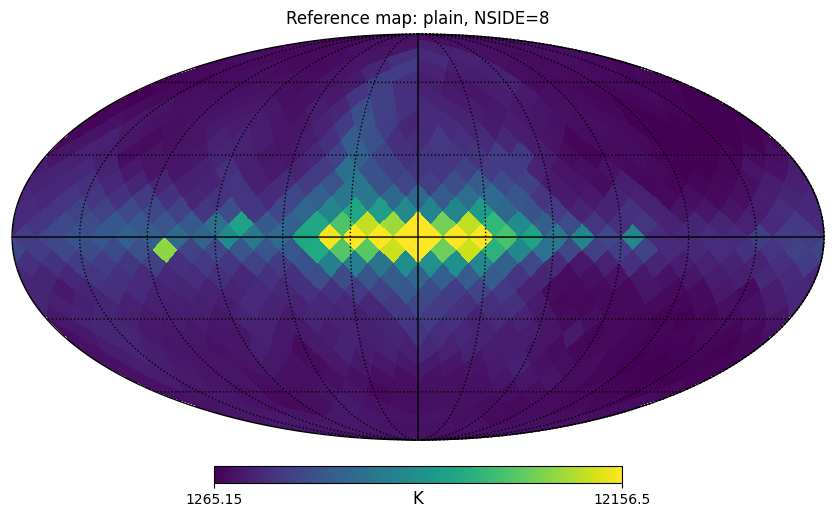

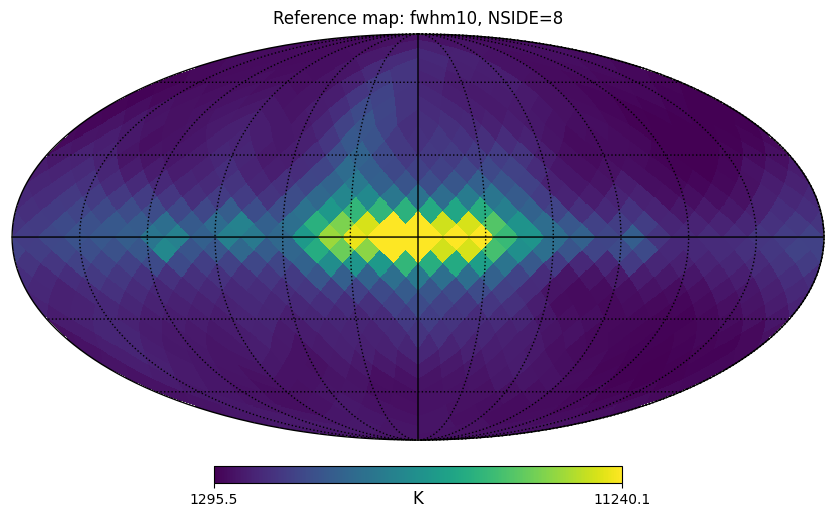

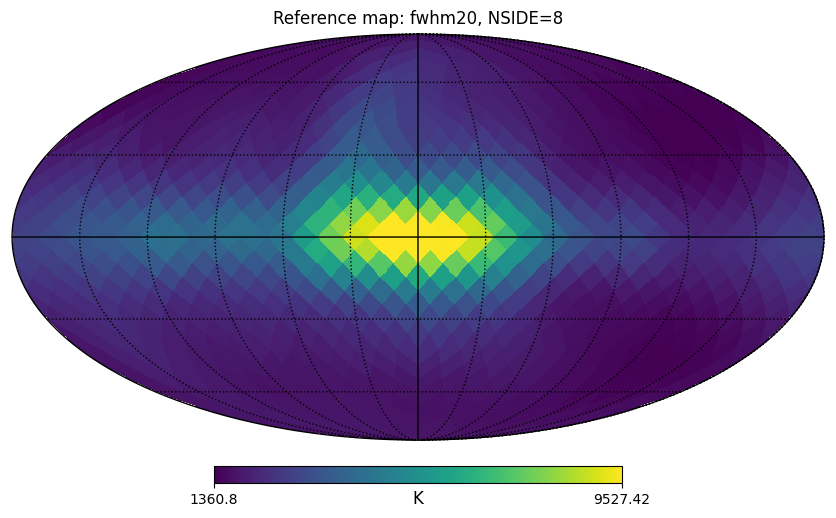

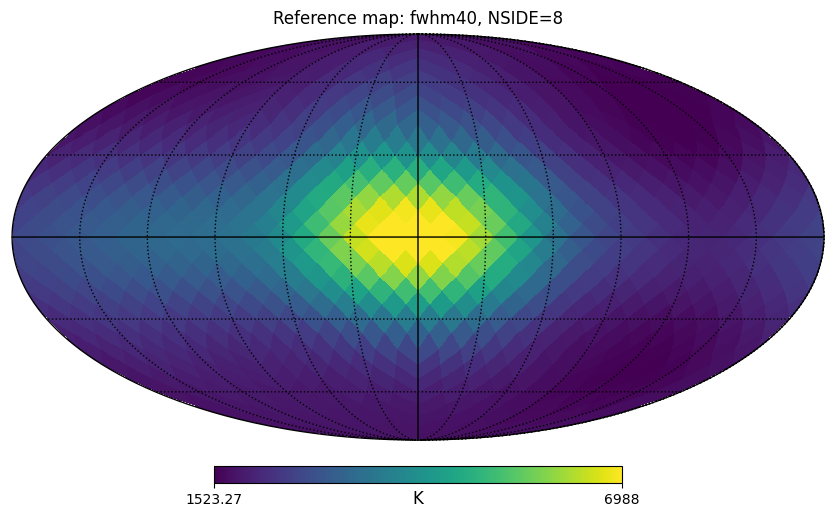

In [27]:

reference_maps_full = {}
reference_maps_full["plain"] = simple_degrade_sky(sky_nside32, MAP_NSIDE)
print_percentiles("plain NSIDE32->8", reference_maps_full["plain"])

smoothed_nside32_maps = {}
for fwhm_deg in FWHM_DEG_LIST:
    smoothed32, truth8 = gaussian_degrade_truth_from_sky(sky_nside32, MAP_NSIDE, fwhm_deg)
    smoothed_nside32_maps[fwhm_deg] = smoothed32
    reference_maps_full[f"fwhm{int(fwhm_deg)}"] = truth8
    print(f"\nGaussian reference FWHM={fwhm_deg:.0f} deg")
    print_percentiles("truth NSIDE8", truth8)

for key, m in reference_maps_full.items():
    plot_map(m, title=f"Reference map: {key}, NSIDE={MAP_NSIDE}", unit="K", vmin=finite_percentile(m, 1), vmax=finite_percentile(m, 99))


## 6. Build 24 h Jodrell pointing and self-rotation

N_TIME             = 1440
Observation length = 24.000 h
Samples/rotation   = 60.0
LST range          = 0.073 to 359.823 deg
Self-rot range     = 0.000 to 354.000 deg
Zenith declination at Jodrell is approximately site latitude: Dec ≈ 53.24 deg


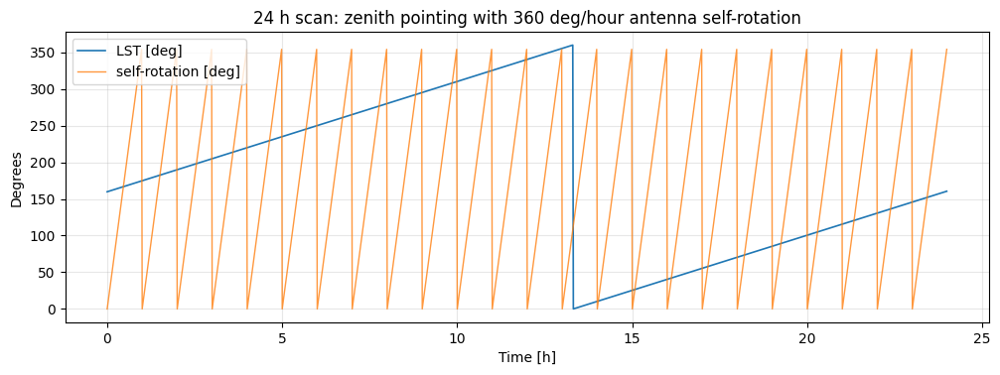

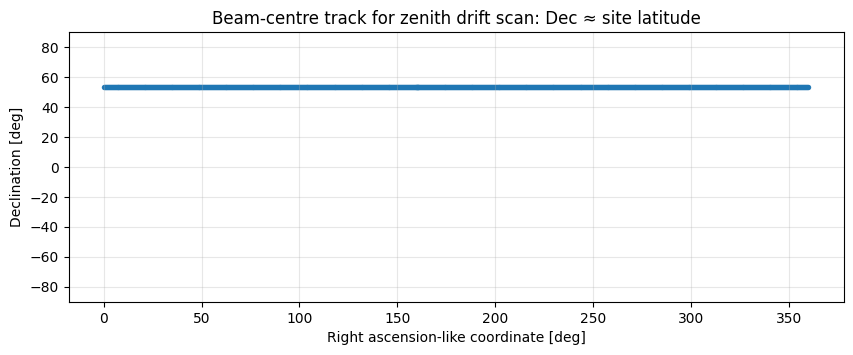

In [28]:

time_s, time_h, LST_deg_list, azimuth_deg_list, elevation_deg_list, selfrot_deg_list = make_time_and_pointing()
print(f"N_TIME             = {N_TIME}")
print(f"Observation length = {time_h[-1] + DT_SECONDS/3600.0:.3f} h")
print(f"Samples/rotation   = {ROTATION_PERIOD_HOURS * 3600.0 / DT_SECONDS:.1f}")
print(f"LST range          = {LST_deg_list.min():.3f} to {LST_deg_list.max():.3f} deg")
print(f"Self-rot range     = {selfrot_deg_list.min():.3f} to {selfrot_deg_list.max():.3f} deg")
print(f"Zenith declination at Jodrell is approximately site latitude: Dec ≈ {ANT_LAT_DEG:.2f} deg")

fig, ax = plt.subplots(figsize=(12, 3.8))
ax.plot(time_h, LST_deg_list, label="LST [deg]", lw=1.2)
ax.plot(time_h, selfrot_deg_list, label="self-rotation [deg]", lw=1.0, alpha=0.8)
ax.set_xlabel("Time [h]"); ax.set_ylabel("Degrees")
ax.set_title("24 h scan: zenith pointing with 360 deg/hour antenna self-rotation")
ax.legend(); ax.grid(alpha=0.3); plt.show()

ra_track = LST_deg_list
Dec_track = np.full_like(ra_track, ANT_LAT_DEG)
plt.figure(figsize=(10, 3.5))
plt.scatter(ra_track, Dec_track, s=8, alpha=0.7)
plt.xlabel("Right ascension-like coordinate [deg]"); plt.ylabel("Declination [deg]")
plt.title("Beam-centre track for zenith drift scan: Dec ≈ site latitude")
plt.ylim(-90, 90); plt.grid(alpha=0.3); plt.show()


## 7. Load real beam

Chosen beam file: /Users/user/LimTOD/rhino-TODsim/data/HornDry/HornDry70.0.fits
Beam NSIDE = 32
Beam peak  = 1
Beam min   = 1.44262e-05
Beam sum   = 462.224 before per-pointing normalisation
If NORMALIZE_BEAM=True, each pointed/truncated beam is re-normalised to sum=1 inside TOD and operator construction.


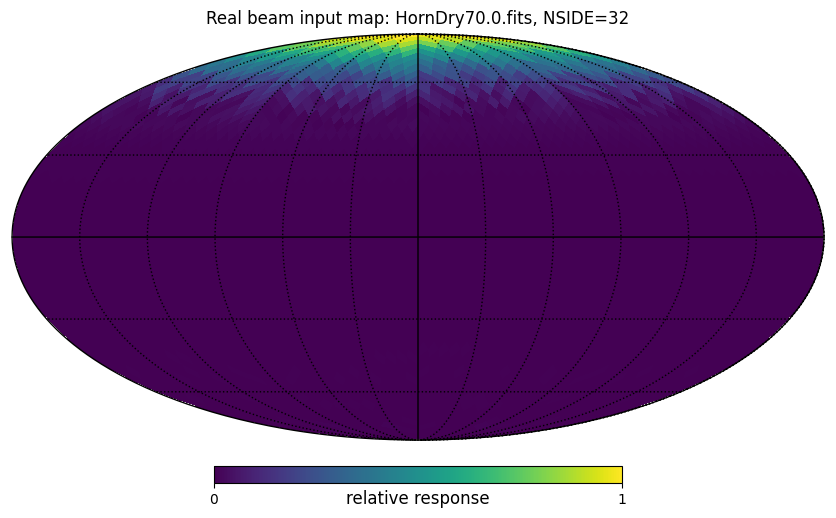

In [29]:

beam_file = find_beam_file(BEAM_DIR, FREQ_MHZ)
real_beam = load_healpix_beam_from_fits(beam_file, target_nside=SIM_NSIDE)
print(f"Beam NSIDE = {get_nside(real_beam)}")
print(f"Beam peak  = {np.nanmax(real_beam):.6g}")
print(f"Beam min   = {np.nanmin(real_beam):.6g}")
print(f"Beam sum   = {np.nansum(real_beam):.6g} before per-pointing normalisation")
print("If NORMALIZE_BEAM=True, each pointed/truncated beam is re-normalised to sum=1 inside TOD and operator construction.")
plot_map(real_beam, title=f"Real beam input map: {beam_file.name}, NSIDE={SIM_NSIDE}", unit="relative response", vmin=0, vmax=1)


## 8. Build matched mapmaker operator


Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 946.79it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 336


100%|██████████| 1440/1440 [00:01<00:00, 749.65it/s]


Number of data points: 1440
Number of selected pixels: 336


100%|██████████| 1440/1440 [00:01<00:00, 924.98it/s]


MAP_NSIDE total pixels       = 768
Solved pixels                = 336
A shape                      = (1440, 336)
Row sums min/med/max         = 1 / 1 / 1
Hits min/med/max             = 1 / 404.0 / 938
Weighted hits min/med/max    = 0.00183632 / 4.284 / 9.91024
Singular values max/min      = 2.67295 / 0.00160064
Condition number             = 1669.93
Numerical rank               = 336 / 336


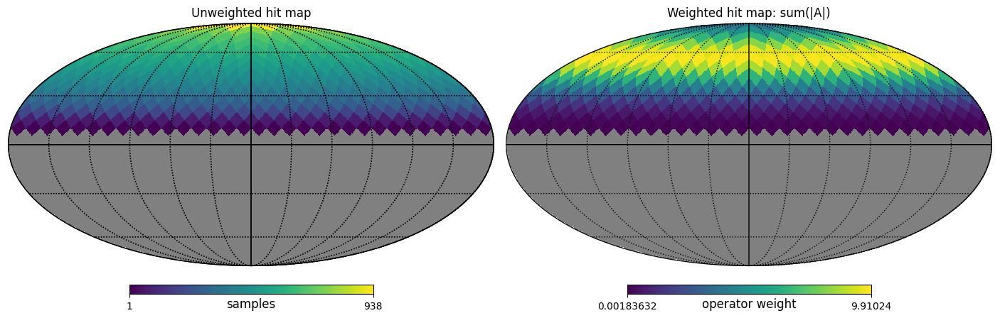

Reference patch keys: ['plain', 'fwhm10', 'fwhm20', 'fwhm40']
plain patch                       : min/p1/p5/med/p95/p99/max = 1182 / 1216 / 1330 / 2048 / 4700 / 6327 / 7706
fwhm10 patch                      : min/p1/p5/med/p95/p99/max = 1237 / 1256 / 1357 / 2083 / 4809 / 7458 / 7874
fwhm20 patch                      : min/p1/p5/med/p95/p99/max = 1315 / 1342 / 1423 / 2130 / 5118 / 7710 / 8290
fwhm40 patch                      : min/p1/p5/med/p95/p99/max = 1487 / 1501 / 1563 / 2282 / 5321 / 6418 / 6899


In [30]:

mapper = build_mapper_with_matched_operator(real_beam, LST_deg_list, azimuth_deg_list, elevation_deg_list, selfrot_deg_list)
pix = np.asarray(mapper.pixel_indices, dtype=int)
A = np.asarray(mapper.Tsys_operators, dtype=float)
hits_patch, weighted_hits_patch = compute_hitmap_from_operator(A)

print(f"MAP_NSIDE total pixels       = {hp.nside2npix(MAP_NSIDE)}")
print(f"Solved pixels                = {len(pix)}")
print(f"A shape                      = {A.shape}")
print(f"Row sums min/med/max         = {A.sum(axis=1).min():.6g} / {np.median(A.sum(axis=1)):.6g} / {A.sum(axis=1).max():.6g}")
print(f"Hits min/med/max             = {hits_patch.min()} / {np.median(hits_patch):.1f} / {hits_patch.max()}")
print(f"Weighted hits min/med/max    = {weighted_hits_patch.min():.6g} / {np.median(weighted_hits_patch):.6g} / {weighted_hits_patch.max():.6g}")
s = np.linalg.svd(A, compute_uv=False)
print(f"Singular values max/min      = {s[0]:.6g} / {s[-1]:.6g}")
print(f"Condition number             = {s[0] / s[-1]:.6g}")
print(f"Numerical rank               = {np.linalg.matrix_rank(A)} / {A.shape[1]}")

plt.figure(figsize=(14, 5))
hp.mollview(patch_to_full(hits_patch, pix, MAP_NSIDE), title="Unweighted hit map", unit="samples", sub=(1, 2, 1), badcolor="gray"); hp.graticule()
hp.mollview(patch_to_full(weighted_hits_patch, pix, MAP_NSIDE), title="Weighted hit map: sum(|A|)", unit="operator weight", sub=(1, 2, 2), badcolor="gray"); hp.graticule()
plt.show()

reference_patches = {name: full_to_patch(m, pix) for name, m in reference_maps_full.items()}
print("Reference patch keys:", list(reference_patches.keys()))
for name, patch in reference_patches.items(): print_percentiles(f"{name} patch", patch)


## 9. Closure tests: does A recover maps generated by A?

,reference,n_pix,rmse,bias,std,corr
0,plain,336,1.033891,-0.263490,0.999751,1.0
1,fwhm10,336,1.087747,-0.278537,1.051480,1.0
2,fwhm20,336,1.103252,-0.285592,1.065647,1.0
3,fwhm40,336,0.981039,-0.256539,0.946903,1.0


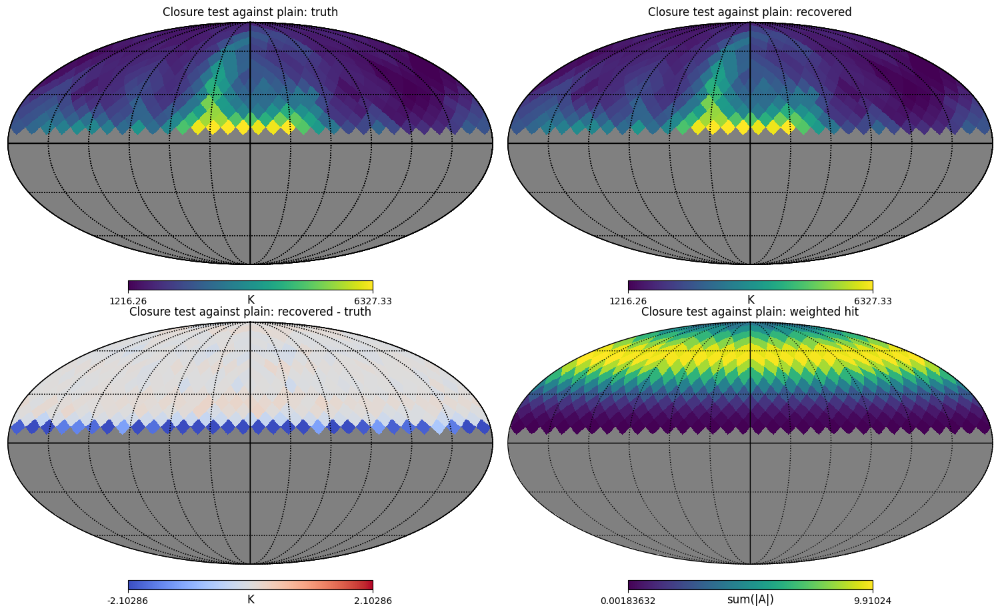

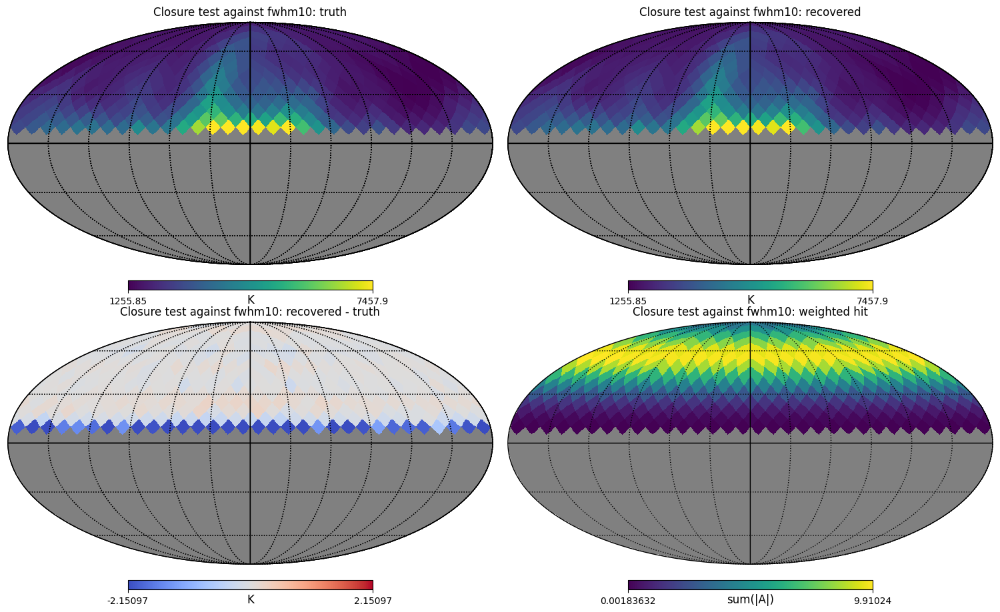

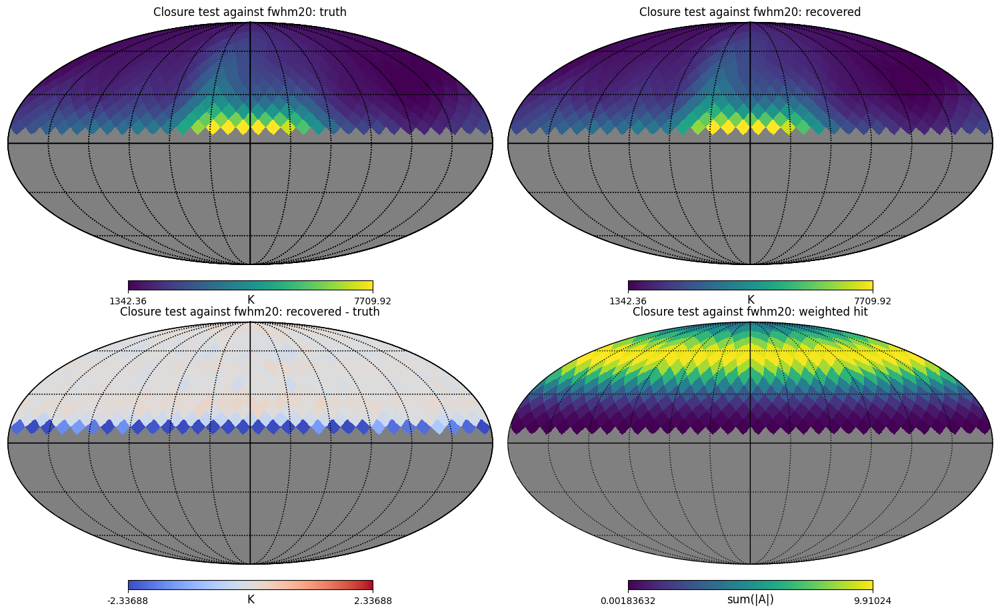

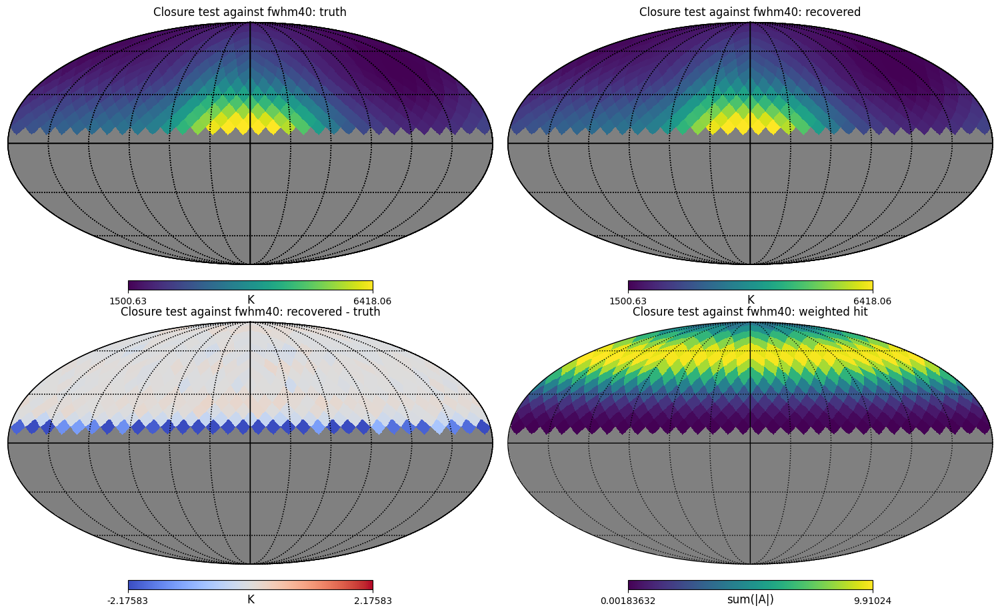

In [38]:

closure_rows = []
closure_results = {}
for ref_name, truth_patch in reference_patches.items():
    closure_tod = A @ truth_patch
    rec_closure, unc_closure = mapper(TOD_group=closure_tod, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, use_high_pass=False)
    rec_closure = np.asarray(rec_closure).reshape(-1)
    closure_results[ref_name] = rec_closure
    closure_rows.append({"reference": ref_name, **map_metrics(rec_closure, truth_patch, weighted_hits_patch, cut=0.0)})
closure_df = pd.DataFrame(closure_rows)
display(closure_df)
for ref_name in ["plain", "fwhm10", "fwhm20", "fwhm40"]:
    plot_four_panel(reference_patches[ref_name], closure_results[ref_name], weighted_hits_patch, pix, title=f"Closure test against {ref_name}", nside=MAP_NSIDE, hit_label="sum(|A|)")


## 10. Generate actual high-NSIDE limTOD TOD

100%|██████████| 1440/1440 [00:01<00:00, 759.49it/s]

actual_TOD                        : min/p1/p5/med/p95/p99/max = 1448 / 1451 / 1462 / 1848 / 2766 / 2834 / 2844


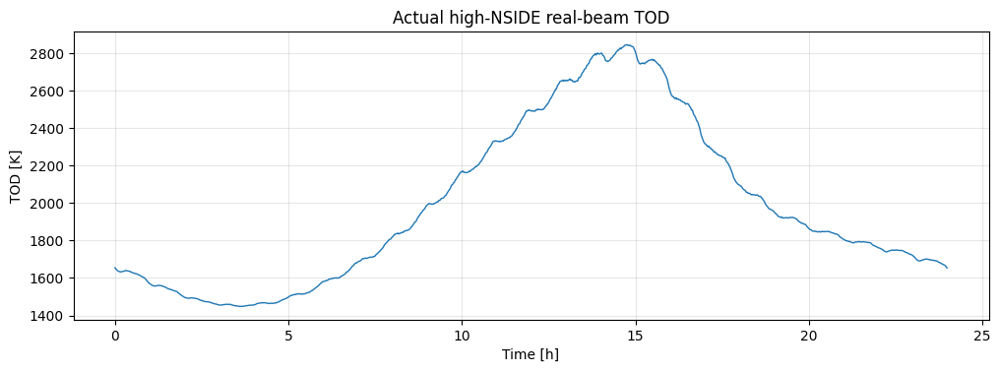

,reference,std(actual_TOD - A@ref)_K,relative_std_mismatch,corr_TOD_pred
0,plain,7.847243,0.018252,0.999834
1,fwhm10,9.877898,0.022975,0.999737
2,fwhm20,20.289457,0.047191,0.998889
3,fwhm40,53.188906,0.123711,0.994296


In [32]:

actual_TOD = generate_TOD_sky(
    beam_map=real_beam, sky_map=sky_nside32, LST_deg_list=LST_deg_list, lat_deg=ANT_LAT_DEG,
    azimuth_deg_list=azimuth_deg_list, elevation_deg_list=elevation_deg_list, selfrot_deg_list=selfrot_deg_list,
    nside_hires=SIM_NSIDE, normalize_beam=NORMALIZE_BEAM, truncate_frac_thres=BEAM_TRUNCATE_FRAC,
)
actual_TOD = np.asarray(actual_TOD, dtype=float).reshape(-1)
print_percentiles("actual_TOD", actual_TOD)
fig, ax = plt.subplots(figsize=(12, 3.8))
ax.plot(time_h, actual_TOD, lw=1.0)
ax.set_xlabel("Time [h]"); ax.set_ylabel("TOD [K]"); ax.set_title("Actual high-NSIDE real-beam TOD"); ax.grid(alpha=0.3); plt.show()

forward_rows = []
for ref_name, truth_patch in reference_patches.items():
    pred = A @ truth_patch
    diff = actual_TOD - pred
    forward_rows.append({"reference": ref_name, "std(actual_TOD - A@ref)_K": float(np.std(diff)), "relative_std_mismatch": float(np.std(diff)/np.std(actual_TOD)), "corr_TOD_pred": float(np.corrcoef(actual_TOD, pred)[0, 1])})
forward_df = pd.DataFrame(forward_rows)
display(forward_df)


## 11. Prior and regularisation scales

The solver is trying to fit

\[(A^T N^{-1} A + S^{-1} + \lambda I)m = A^T N^{-1}d + S^{-1}\mu\]

`regularization` is the generic diagonal stabiliser \(\lambda\). `Tsky_prior_mean` is \(\mu\). `Tsky_prior_inv_cov_diag` is \(S^{-1}=1/\sigma^2\). So `sigma_prior` is in K.

A relative prior like `0.5` means `sigma_prior[pixel] = max(0.5 * abs(prior_mean[pixel]), floor_K)`. It is a 50% uncertainty prior, not a 0.5 K prior.


In [33]:

AtA_diag = np.sum(A**2, axis=0) / NOISE_VARIANCE
print_percentiles("diag(A^T A)", AtA_diag)
print("\nRegularisation choices:")
print("  REG_WEAK  =", REG_WEAK)
print("  REG_RIDGE =", REG_RIDGE)
print("\nAbsolute sigma prior precisions:")
for sigma in ABSOLUTE_SIGMA_K_LIST:
    prior_precision = 1.0 / sigma**2
    print(f"  sigma={sigma:8.1f} K -> precision={prior_precision:.3e}, precision/REG_WEAK={prior_precision/REG_WEAK:.3e}, precision/REG_RIDGE={prior_precision/REG_RIDGE:.3e}")
prior_mean_for_scale = reference_patches[f"fwhm{int(REFERENCE_FOR_PRIOR)}"]
print("\nRelative prior sigma examples using the FWHM prior mean:")
for frac in RELATIVE_SIGMA_FRAC_LIST:
    sigma_pix = np.maximum(frac * np.abs(prior_mean_for_scale), RELATIVE_SIGMA_FLOOR_K)
    precision_pix = 1.0 / sigma_pix**2
    print(f"  frac={frac}: sigma pix percentiles [K] =", np.nanpercentile(sigma_pix, [0, 5, 50, 95, 100]))
    print(f"            precision percentiles =", np.nanpercentile(precision_pix, [0, 5, 50, 95, 100]))


diag(A^T A)                       : min/p1/p5/med/p95/p99/max = 3.372e-06 / 1.531e-05 / 2.229e-05 / 0.03982 / 0.253 / 0.2545 / 0.2581

Regularisation choices:
  REG_WEAK  = 1e-08
  REG_RIDGE = 0.0001

Absolute sigma prior precisions:
  sigma=  5000.0 K -> precision=4.000e-08, precision/REG_WEAK=4.000e+00, precision/REG_RIDGE=4.000e-04
  sigma=  2000.0 K -> precision=2.500e-07, precision/REG_WEAK=2.500e+01, precision/REG_RIDGE=2.500e-03
  sigma=  1000.0 K -> precision=1.000e-06, precision/REG_WEAK=1.000e+02, precision/REG_RIDGE=1.000e-02
  sigma=   500.0 K -> precision=4.000e-06, precision/REG_WEAK=4.000e+02, precision/REG_RIDGE=4.000e-02
  sigma=   200.0 K -> precision=2.500e-05, precision/REG_WEAK=2.500e+03, precision/REG_RIDGE=2.500e-01
  sigma=   100.0 K -> precision=1.000e-04, precision/REG_WEAK=1.000e+04, precision/REG_RIDGE=1.000e+00

Relative prior sigma examples using the FWHM prior mean:
  frac=0.5: sigma pix percentiles [K] = [ 743.40404785  781.60614254 1141.00984674 2660.69

## 12. Recover actual TOD: no prior, ridge, absolute priors, relative priors

In [34]:

prior_ref_key = f"fwhm{int(REFERENCE_FOR_PRIOR)}"
prior_mean = reference_patches[prior_ref_key].copy()
recovery_cases = {}

rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, use_high_pass=False)
recovery_cases["no_prior_reg1e-8"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "no_prior", "regularization": REG_WEAK}

rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_RIDGE, use_high_pass=False)
recovery_cases["no_prior_reg1e-4"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "ridge_only", "regularization": REG_RIDGE}

for sigma_k in ABSOLUTE_SIGMA_K_LIST:
    prior_inv_cov_diag = np.ones_like(prior_mean) / sigma_k**2
    rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, Tsky_prior_mean=prior_mean, Tsky_prior_inv_cov_diag=prior_inv_cov_diag, use_high_pass=False)
    recovery_cases[f"abs_prior_sigma{int(sigma_k)}K_reg1e-8"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "absolute_prior", "regularization": REG_WEAK, "sigma_description": f"{sigma_k:.0f} K everywhere"}

for frac in RELATIVE_SIGMA_FRAC_LIST:
    sigma_pix = np.maximum(frac * np.abs(prior_mean), RELATIVE_SIGMA_FLOOR_K)
    prior_inv_cov_diag = 1.0 / sigma_pix**2
    rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, Tsky_prior_mean=prior_mean, Tsky_prior_inv_cov_diag=prior_inv_cov_diag, use_high_pass=False)
    recovery_cases[f"rel_prior_{frac:.1f}_reg1e-8"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "relative_prior", "regularization": REG_WEAK, "sigma_description": f"sigma_pix=max({frac}*prior_mean, {RELATIVE_SIGMA_FLOOR_K:.0f} K)", "sigma_pix": sigma_pix}

print("Recovery cases:")
for name, d in recovery_cases.items():
    print("-", name, "|", d.get("kind"), "| reg=", d.get("regularization"), "|", d.get("sigma_description", ""))
    print_percentiles("  recovered", d["map"])


Recovery cases:
- no_prior_reg1e-8 | no_prior | reg= 1e-08 | 
  recovered                       : min/p1/p5/med/p95/p99/max = -166.7 / 835.6 / 1285 / 1931 / 3949 / 6907 / 9906
- no_prior_reg1e-4 | ridge_only | reg= 0.0001 | 
  recovered                       : min/p1/p5/med/p95/p99/max = 27.64 / 167.1 / 547.3 / 1799 / 3313 / 4169 / 4522
- abs_prior_sigma5000K_reg1e-8 | absolute_prior | reg= 1e-08 | 5000 K everywhere
  recovered                       : min/p1/p5/med/p95/p99/max = -158.8 / 838.4 / 1285 / 1931 / 3950 / 6907 / 9898
- abs_prior_sigma2000K_reg1e-8 | absolute_prior | reg= 1e-08 | 2000 K everywhere
  recovered                       : min/p1/p5/med/p95/p99/max = -117.9 / 853.2 / 1285 / 1931 / 3951 / 6905 / 9858
- abs_prior_sigma1000K_reg1e-8 | absolute_prior | reg= 1e-08 | 1000 K everywhere
  recovered                       : min/p1/p5/med/p95/p99/max = 20.47 / 999.1 / 1285 / 1931 / 3954 / 6898 / 9721
- abs_prior_sigma500K_reg1e-8 | absolute_prior | reg= 1e-08 | 500 K everywher

## 13. Compare all recovery cases against all references

In [35]:

metric_rows = []
for case_name, case in recovery_cases.items():
    rec = case["map"]
    for ref_name, truth_patch in reference_patches.items():
        for cut in WEIGHTED_HIT_CUTS:
            metric_rows.append({"case": case_name, "kind": case.get("kind"), "regularization": case.get("regularization"), "reference": ref_name, "weighted_hit_cut": cut, **map_metrics(rec, truth_patch, weighted_hits_patch, cut=cut)})
metrics_df = pd.DataFrame(metric_rows)
focus_df = metrics_df[(metrics_df["reference"] == prior_ref_key) & (metrics_df["weighted_hit_cut"] == PLOT_HIT_CUT)].copy().sort_values("rmse")
display(focus_df)
display(metrics_df)


,case,kind,regularization,reference,weighted_hit_cut,n_pix,rmse,bias,std,corr
158,abs_prior_sigma100K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,240,501.162742,-270.885537,421.645728,0.833654
38,no_prior_reg1e-4,ridge_only,1.000000e-04,fwhm40,1.0,240,501.336837,-261.613751,427.664435,0.828907
138,abs_prior_sigma200K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,240,516.678720,-270.149920,440.426975,0.817775
198,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,1.0,240,518.674609,-266.984825,444.682418,0.814540
178,rel_prior_0.5_reg1e-8,relative_prior,1.000000e-08,fwhm40,1.0,240,518.838935,-266.835837,444.963455,0.814312
18,no_prior_reg1e-8,no_prior,1.000000e-08,fwhm40,1.0,240,518.930616,-266.739886,445.127866,0.814178
58,abs_prior_sigma5000K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,240,518.932082,-266.752947,445.121748,0.814182
78,abs_prior_sigma2000K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,240,518.939281,-266.820140,445.089868,0.814200
118,abs_prior_sigma500K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,240,518.943980,-267.768809,444.525274,0.814560
98,abs_prior_sigma1000K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,240,518.958339,-267.043920,444.977867,0.814267


,case,kind,regularization,reference,weighted_hit_cut,n_pix,rmse,bias,std,corr
0,no_prior_reg1e-8,no_prior,1.000000e-08,plain,0.0,336,701.357844,-174.286338,679.357857,0.803510
1,no_prior_reg1e-8,no_prior,1.000000e-08,plain,0.2,300,509.377349,-133.296529,491.627216,0.814225
2,no_prior_reg1e-8,no_prior,1.000000e-08,plain,0.5,272,362.558243,-52.545745,358.730295,0.875252
3,no_prior_reg1e-8,no_prior,1.000000e-08,plain,1.0,240,277.678254,-4.448586,277.642617,0.913267
4,no_prior_reg1e-8,no_prior,1.000000e-08,plain,2.0,208,251.353787,23.748737,250.229342,0.920956
...,...,...,...,...,...,...,...,...,...,...
195,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,0.0,336,900.945652,-438.951632,786.781121,0.748559
196,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,0.2,300,806.591815,-443.429749,673.765845,0.749099
197,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,0.5,272,645.201906,-352.881568,540.148218,0.796978
198,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,1.0,240,518.674609,-266.984825,444.682418,0.814540


## 14. Plot key cases against the FWHM=40 reference

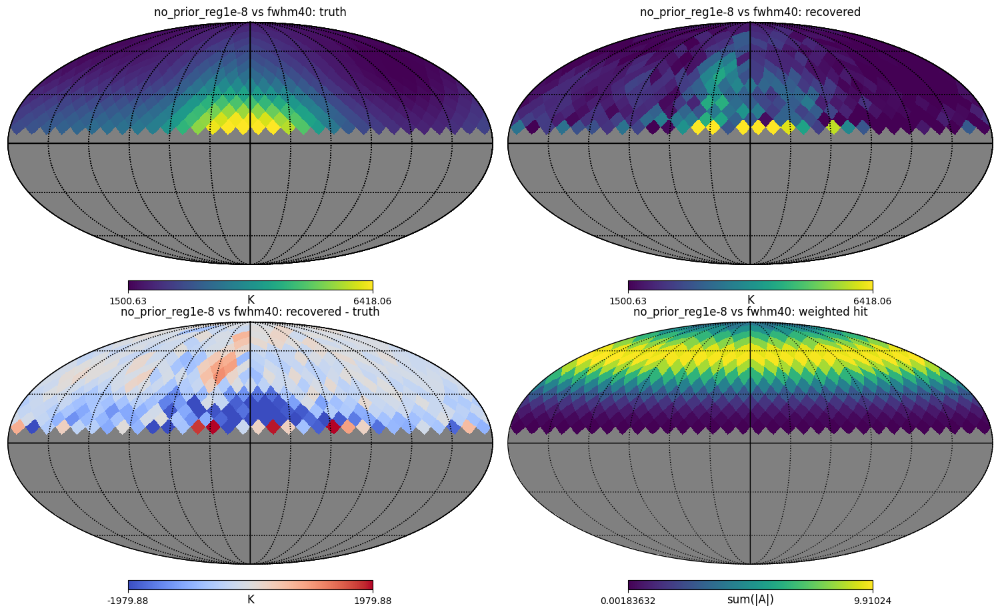

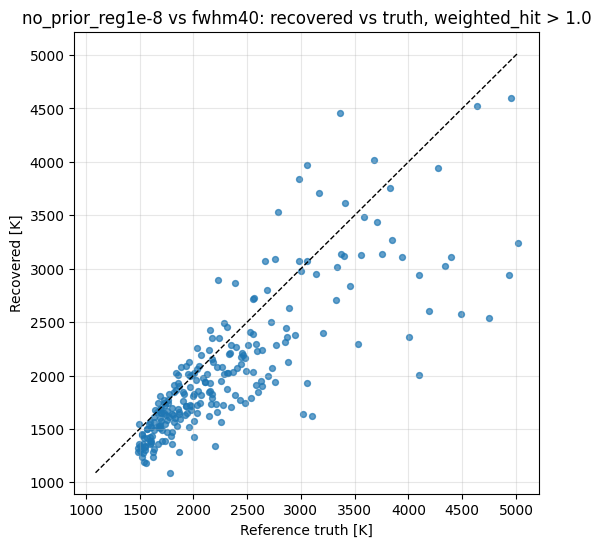

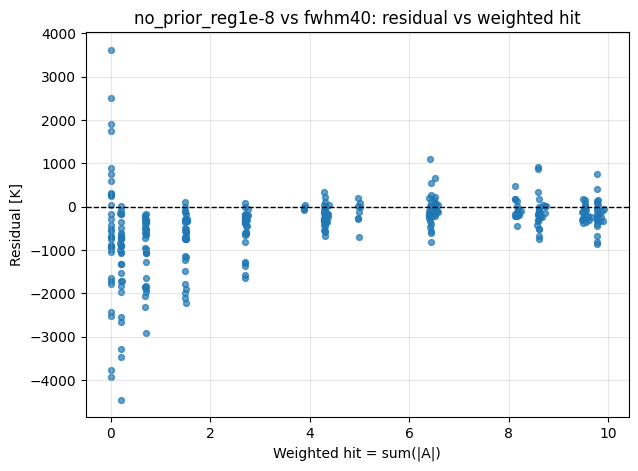

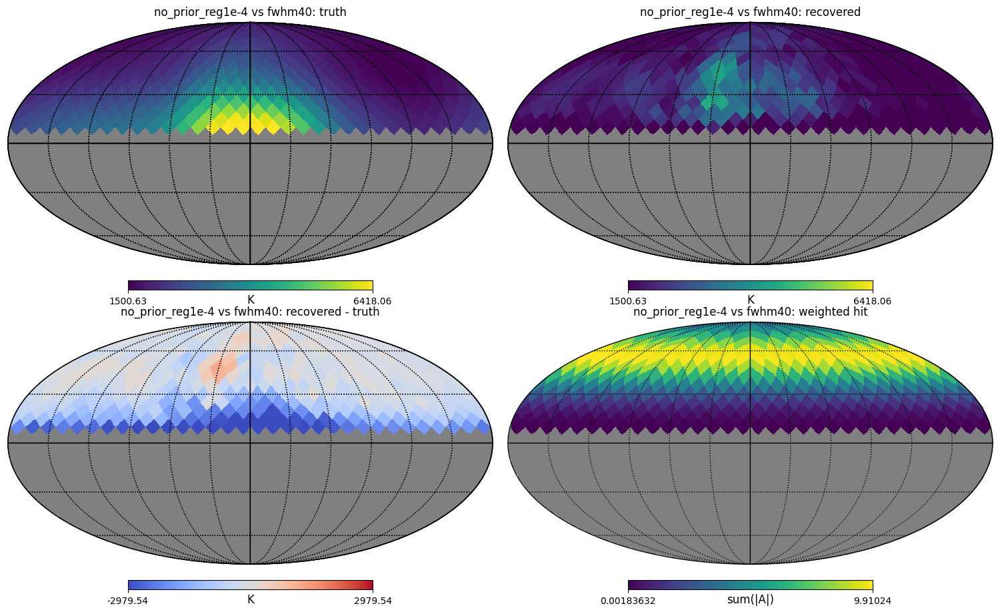

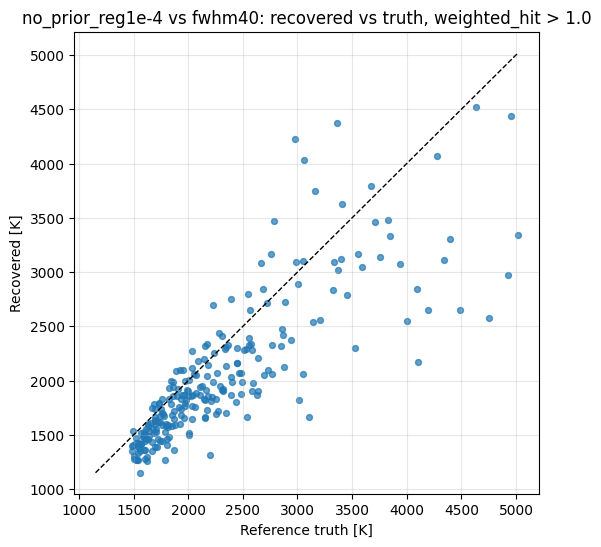

...

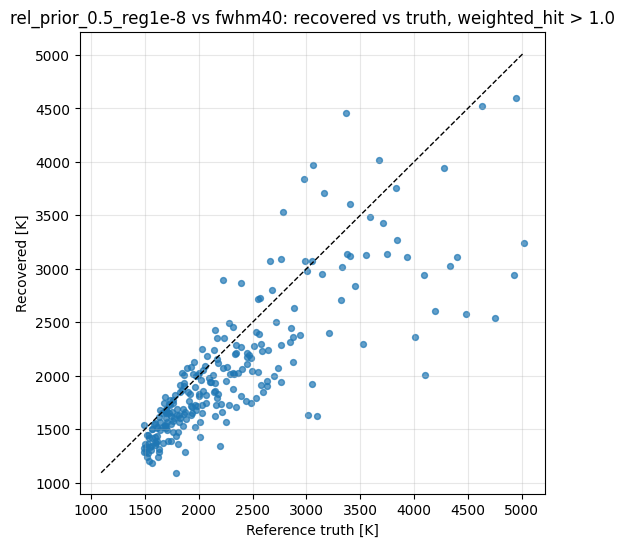

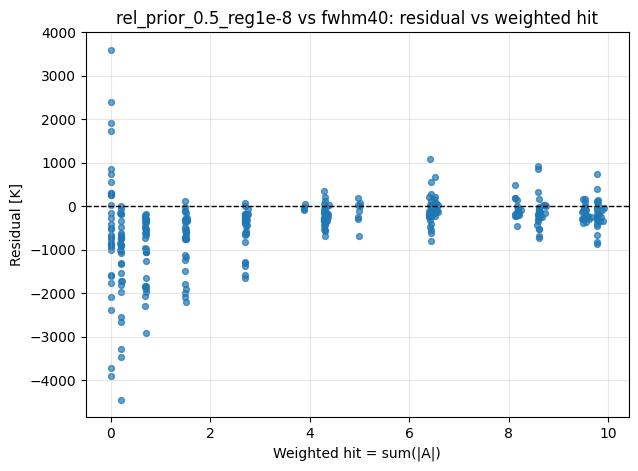

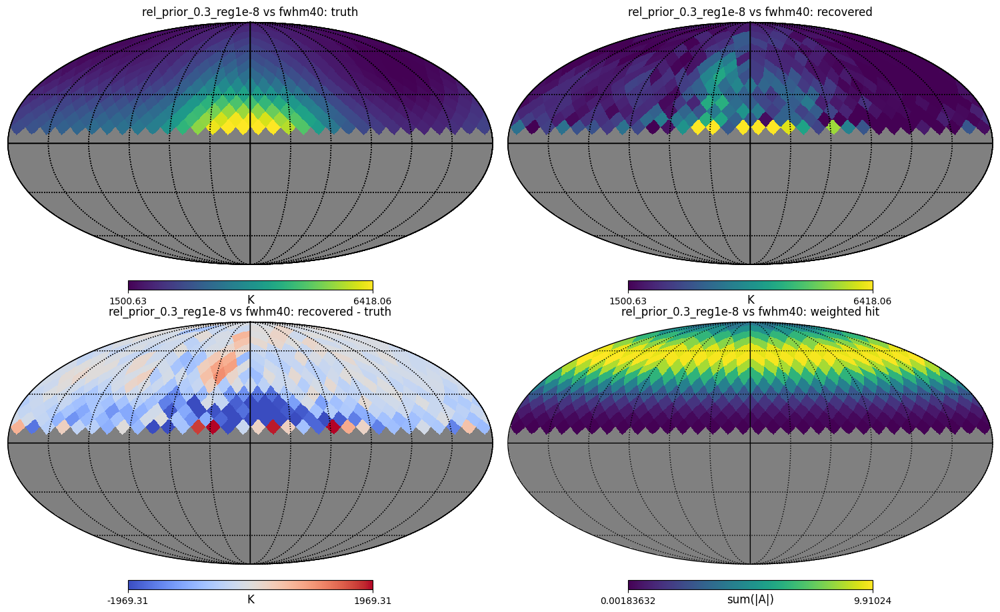

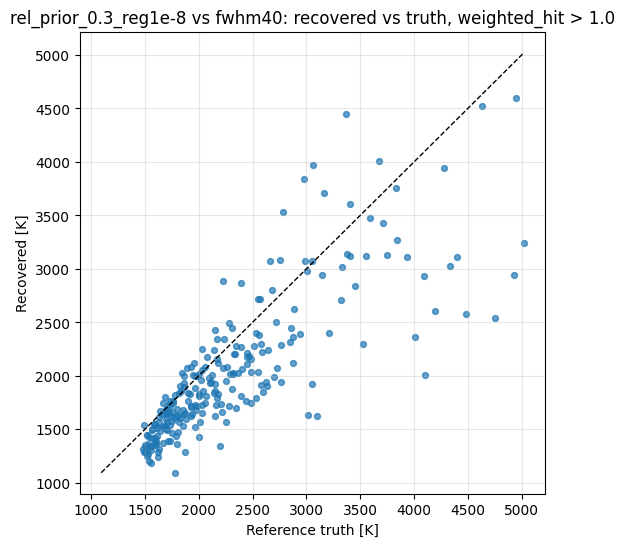

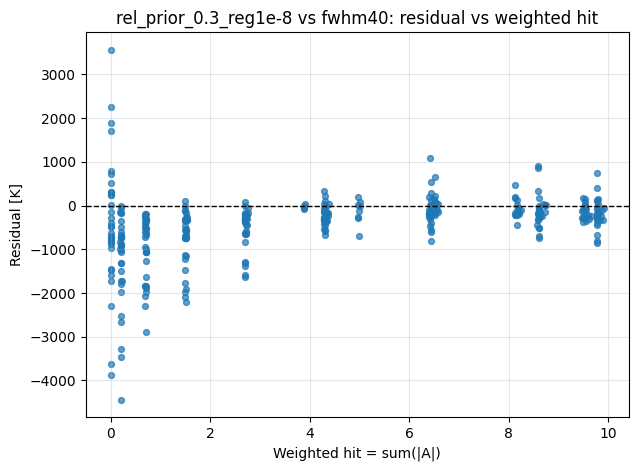

In [36]:

key_cases_to_plot = ["no_prior_reg1e-8", "no_prior_reg1e-4", "abs_prior_sigma2000K_reg1e-8", "abs_prior_sigma1000K_reg1e-8", "rel_prior_0.5_reg1e-8", "rel_prior_0.3_reg1e-8"]
truth_patch = reference_patches[prior_ref_key]
for case_name in key_cases_to_plot:
    if case_name not in recovery_cases:
        continue
    rec = recovery_cases[case_name]["map"]
    plot_four_panel(truth_patch, rec, weighted_hits_patch, pix, title=f"{case_name} vs {prior_ref_key}", nside=MAP_NSIDE, hit_label="sum(|A|)")
    plot_scatter_and_hit(rec, truth_patch, weighted_hits_patch, title=f"{case_name} vs {prior_ref_key}", hit_cut=PLOT_HIT_CUT)


## 15. Also compare key cases against plain degraded sky

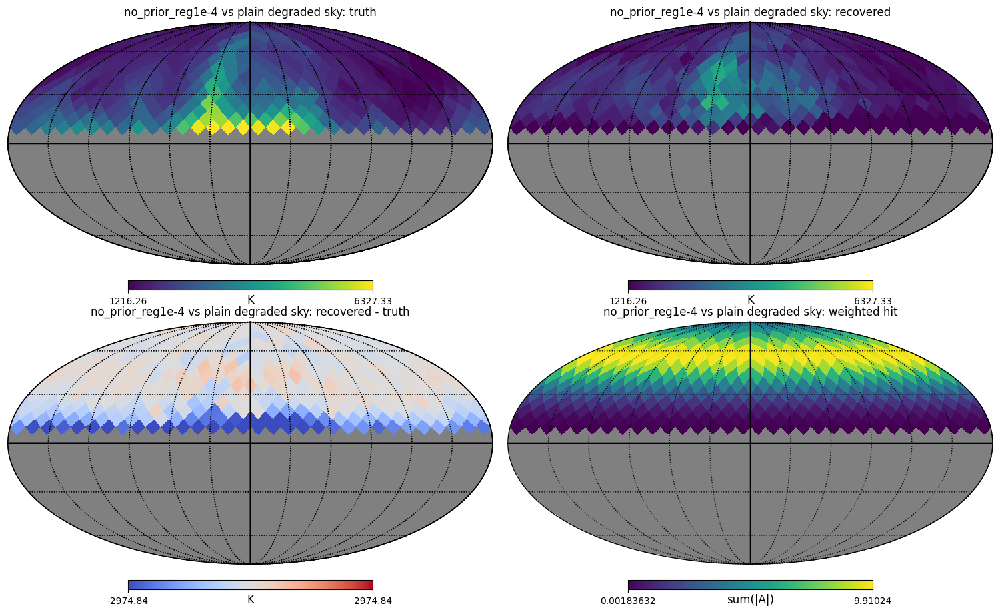

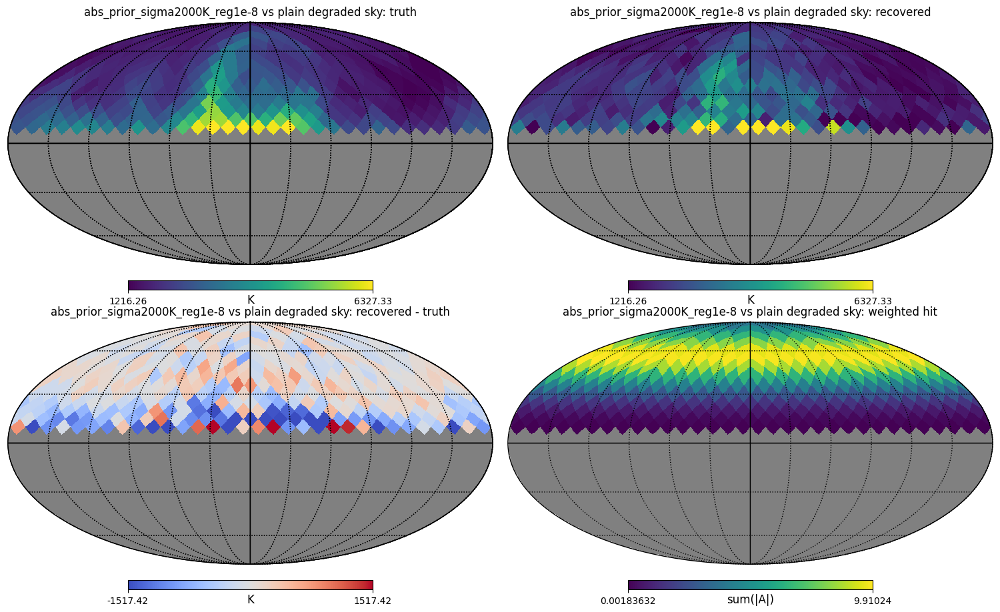

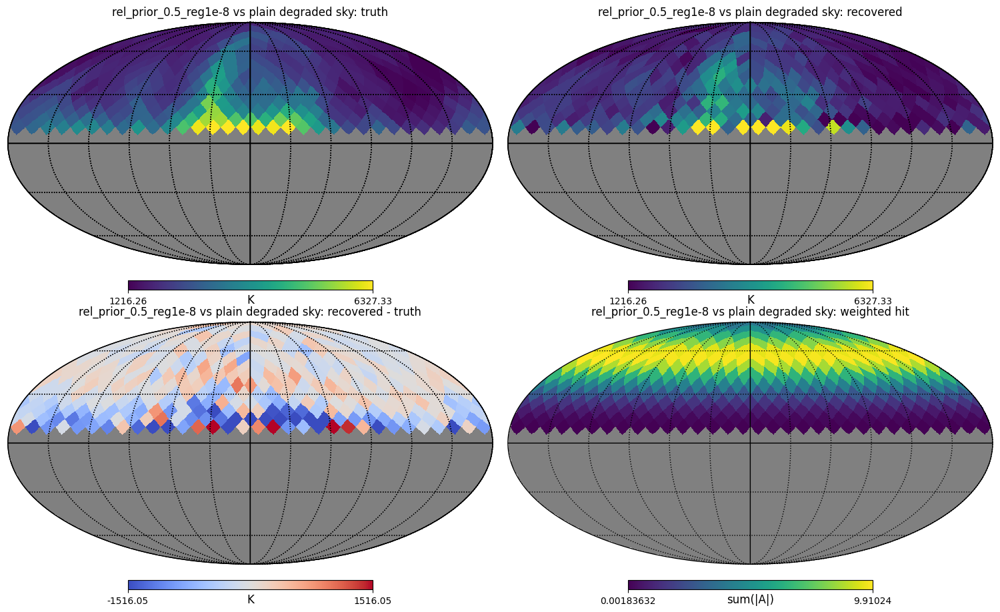

In [37]:

truth_patch_plain = reference_patches["plain"]
for case_name in ["no_prior_reg1e-4", "abs_prior_sigma2000K_reg1e-8", "rel_prior_0.5_reg1e-8"]:
    rec = recovery_cases[case_name]["map"]
    plot_four_panel(truth_patch_plain, rec, weighted_hits_patch, pix, title=f"{case_name} vs plain degraded sky", nside=MAP_NSIDE, hit_label="sum(|A|)")


## 16. Prior-strength summary plots

,case,sigma_K,n_pix,rmse,bias,std,corr
43,abs_prior_sigma5000K_reg1e-8,5000.0,240,518.932082,-266.752947,445.121748,0.814182
58,abs_prior_sigma2000K_reg1e-8,2000.0,240,518.939281,-266.820140,445.089868,0.814200
73,abs_prior_sigma1000K_reg1e-8,1000.0,240,518.958339,-267.043920,444.977867,0.814267
88,abs_prior_sigma500K_reg1e-8,500.0,240,518.943980,-267.768809,444.525274,0.814560
103,abs_prior_sigma200K_reg1e-8,200.0,240,516.678720,-270.149920,440.426975,0.817775
118,abs_prior_sigma100K_reg1e-8,100.0,240,501.162742,-270.885537,421.645728,0.833654


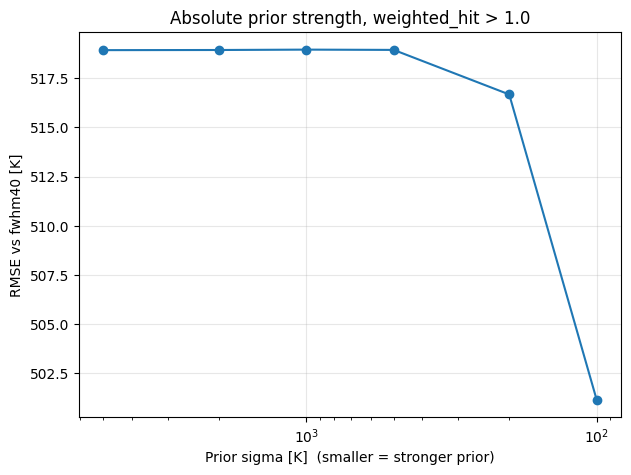

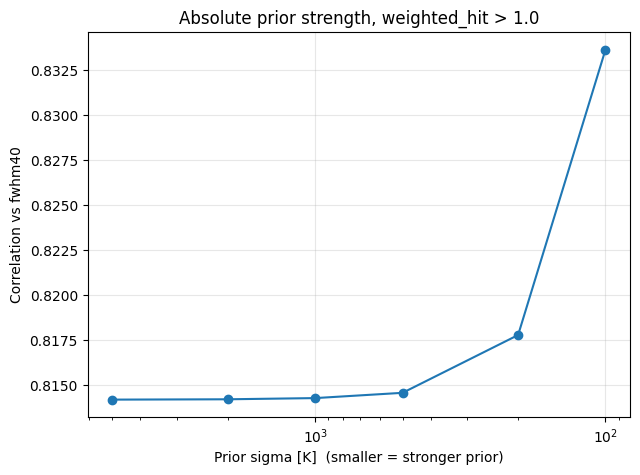

In [16]:

summary_for_plot = metrics_df[(metrics_df["reference"] == prior_ref_key) & (metrics_df["weighted_hit_cut"] == PLOT_HIT_CUT) & (metrics_df["kind"] == "absolute_prior")].copy()
def extract_sigma(case_name):
    m = re.search(r"sigma(\d+)K", case_name)
    return float(m.group(1)) if m else np.nan
summary_for_plot["sigma_K"] = summary_for_plot["case"].apply(extract_sigma)
summary_for_plot = summary_for_plot.sort_values("sigma_K", ascending=False)
display(summary_for_plot[["case", "sigma_K", "n_pix", "rmse", "bias", "std", "corr"]])
plt.figure(figsize=(7, 5))
plt.plot(summary_for_plot["sigma_K"], summary_for_plot["rmse"], marker="o")
plt.xscale("log"); plt.gca().invert_xaxis()
plt.xlabel("Prior sigma [K]  (smaller = stronger prior)"); plt.ylabel(f"RMSE vs {prior_ref_key} [K]")
plt.title(f"Absolute prior strength, weighted_hit > {PLOT_HIT_CUT}"); plt.grid(alpha=0.3); plt.show()
plt.figure(figsize=(7, 5))
plt.plot(summary_for_plot["sigma_K"], summary_for_plot["corr"], marker="o")
plt.xscale("log"); plt.gca().invert_xaxis()
plt.xlabel("Prior sigma [K]  (smaller = stronger prior)"); plt.ylabel(f"Correlation vs {prior_ref_key}")
plt.title(f"Absolute prior strength, weighted_hit > {PLOT_HIT_CUT}"); plt.grid(alpha=0.3); plt.show()


## 17. Interpretation notes printed by notebook

In [17]:

print("INTERPRETATION CHECKLIST")
print("1. If closure tests are excellent, the operator/solver indexing is probably okay.")
print("2. If no_prior_reg1e-8 is unstable but no_prior_reg1e-4 is stable, weak modes are the problem.")
print("3. If priors improve low-hit regions, they are stabilising weak modes, not changing the TOD.")
print("4. If plain reference predicts the TOD better than Gaussian references, the real beam is not acting like that Gaussian smoothing scale.")
print("5. Quote metrics with weighted_hit cuts, especially weighted_hit >", PLOT_HIT_CUT)

best_focus = focus_df.iloc[0]
print("\nBest case in focus table against", prior_ref_key, "with weighted_hit >", PLOT_HIT_CUT)
print(best_focus)


INTERPRETATION CHECKLIST
1. If closure tests are excellent, the operator/solver indexing is probably okay.
2. If no_prior_reg1e-8 is unstable but no_prior_reg1e-4 is stable, weak modes are the problem.
3. If priors improve low-hit regions, they are stabilising weak modes, not changing the TOD.
4. If plain reference predicts the TOD better than Gaussian references, the real beam is not acting like that Gaussian smoothing scale.
5. Quote metrics with weighted_hit cuts, especially weighted_hit > 1.0

Best case in focus table against fwhm40 with weighted_hit > 1.0
case                abs_prior_sigma100K_reg1e-8
kind                             absolute_prior
regularization                              0.0
reference                                fwhm40
weighted_hit_cut                            1.0
n_pix                                       240
rmse                                 501.162742
bias                                -270.885537
std                                  421.645728
c

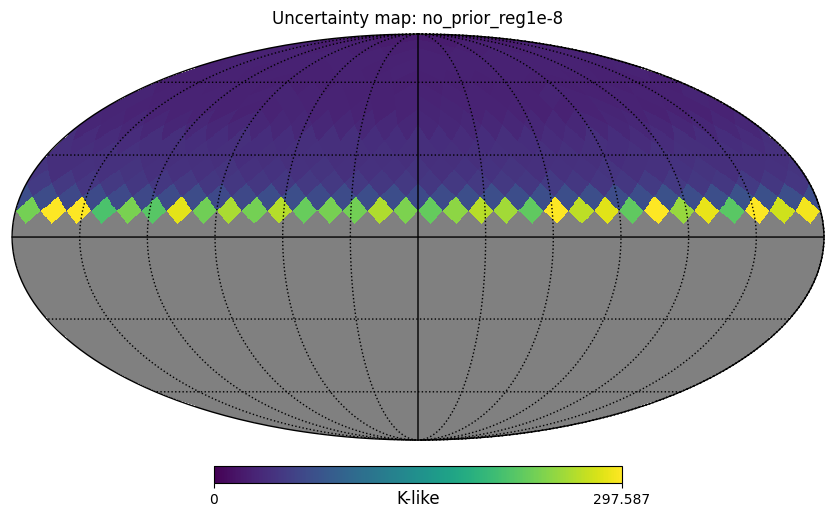


no_prior_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 22.92681552  24.32191055  27.27194047  39.56903833 247.84632878
 297.58683318 622.5586413 ]


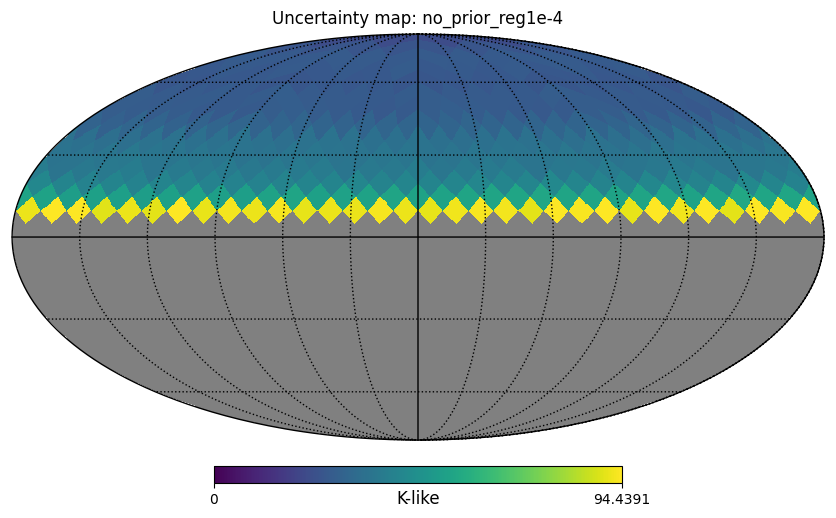


no_prior_reg1e-4
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[21.79651697 22.99858184 25.35689735 35.65476435 92.3987475  94.43907831
 98.67959871]


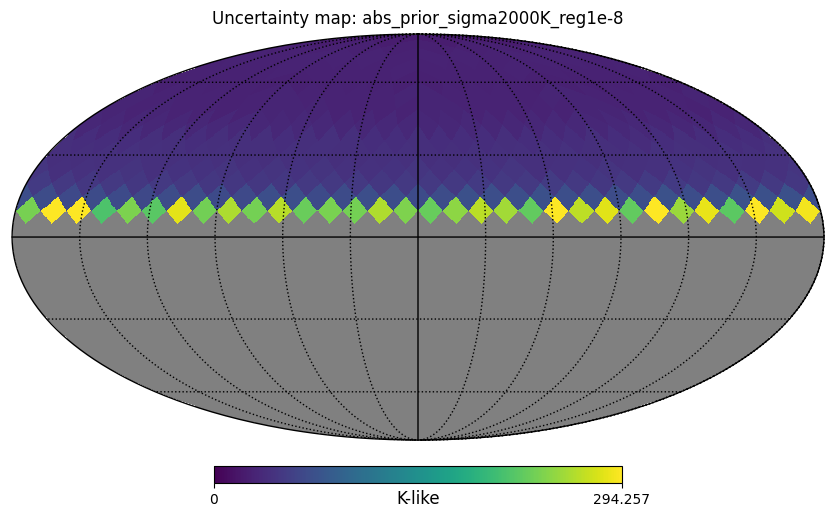


abs_prior_sigma2000K_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 22.92000077  24.31143157  27.25919871  39.55110733 245.91983065
 294.25690472 594.3542081 ]


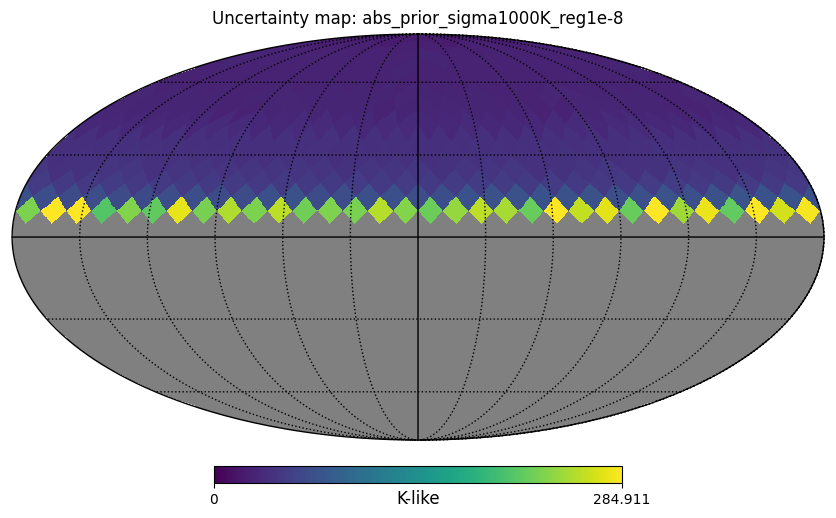


abs_prior_sigma1000K_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 22.9006147   24.2830129   27.22280162  39.49905894 240.40459691
 284.91079844 528.31192609]


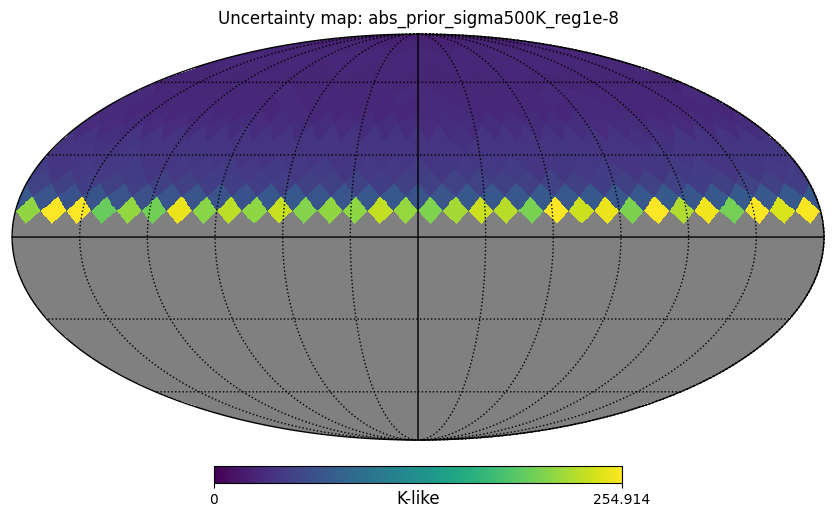


abs_prior_sigma500K_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 22.83382357  24.19308118  27.09694448  39.29291908 221.60213781
 254.91414444 389.55197777]


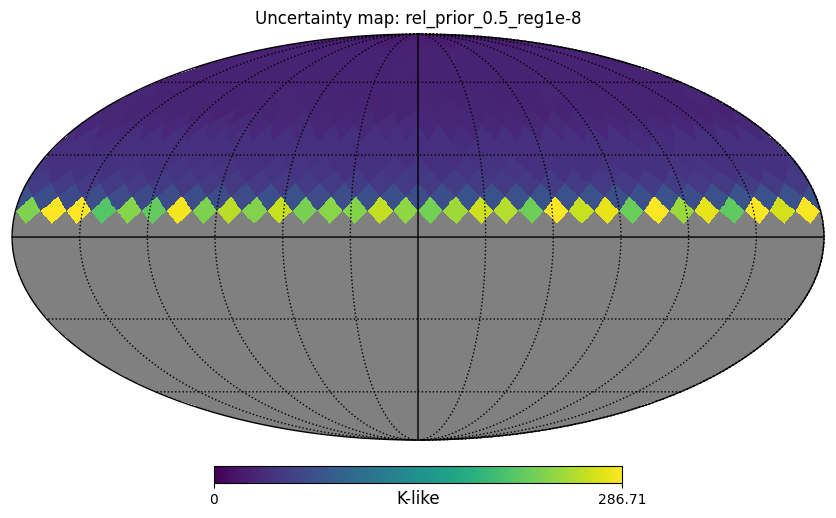


rel_prior_0.5_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 22.90836117  24.2968603   27.25244832  39.52605427 244.53815923
 286.7103095  567.54204823]


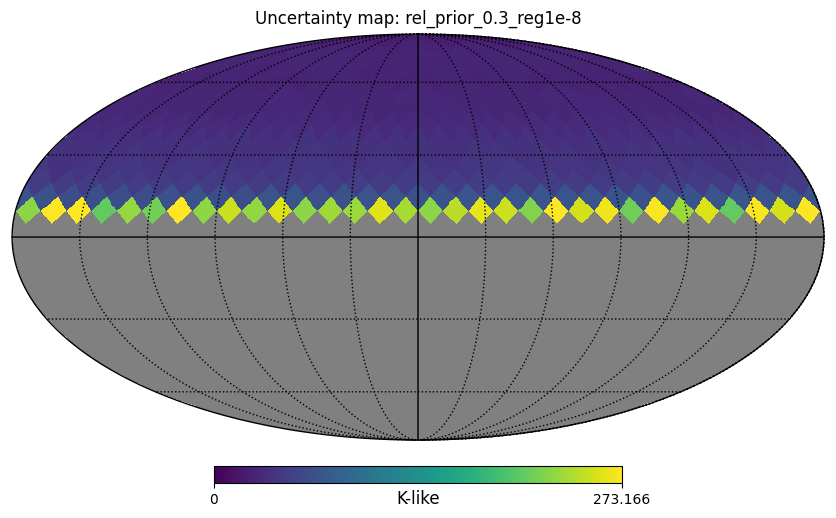


rel_prior_0.3_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 22.8770982   24.25717657  27.21920854  39.43171557 238.88505081
 273.16583805 497.71444826]


In [22]:
# ============================================================
# PLOT UNCERTAINTY MAPS FROM EXISTING recovery_cases
# Uses the notebook's actual key: case["unc"]
# ============================================================

import numpy as np
import healpy as hp
import matplotlib.pyplot as plt

def patch_to_full_map(patch, pix, nside, fill=hp.UNSEEN):
    full = np.full(hp.nside2npix(nside), fill, dtype=float)
    full[np.asarray(pix)] = np.asarray(patch).reshape(-1)
    return full


def plot_uncertainty_map_from_case(case_name, case, pix, nside, percentile_max=99):
    if "unc" not in case:
        print(f"Skipping {case_name}: no `unc` stored.")
        return

    unc_patch = np.asarray(case["unc"]).reshape(-1)
    unc_full = patch_to_full_map(unc_patch, pix, nside)

    finite = np.isfinite(unc_patch)
    vmax = np.nanpercentile(unc_patch[finite], percentile_max)

    hp.mollview(
        unc_full,
        title=f"Uncertainty map: {case_name}",
        unit="K-like",
        min=0,
        max=vmax,
        badcolor="gray",
    )
    hp.graticule()
    plt.show()

    print(f"\n{case_name}")
    print("Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:")
    print(np.nanpercentile(unc_patch[finite], [0, 1, 5, 50, 95, 99, 100]))


# ------------------------------------------------------------
# Plot uncertainty maps for selected cases
# ------------------------------------------------------------

cases_to_plot = [
    "no_prior_reg1e-8",
    "no_prior_reg1e-4",
    "abs_prior_sigma2000K_reg1e-8",
    "abs_prior_sigma1000K_reg1e-8",
    "abs_prior_sigma500K_reg1e-8",
    "rel_prior_0.5_reg1e-8",
    "rel_prior_0.3_reg1e-8",
]

for case_name in cases_to_plot:
    if case_name not in recovery_cases:
        print(f"Case not found: {case_name}")
        continue

    plot_uncertainty_map_from_case(
        case_name=case_name,
        case=recovery_cases[case_name],
        pix=pix,
        nside=MAP_NSIDE,
        percentile_max=99,
    )

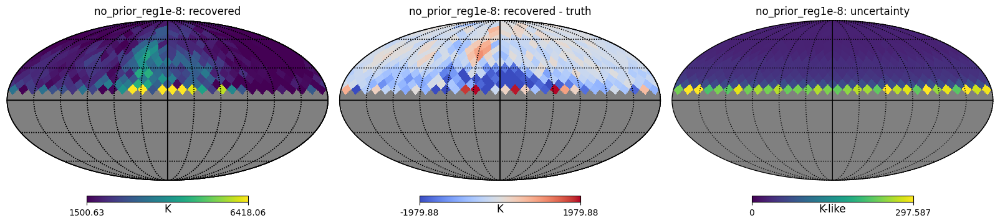


no_prior_reg1e-8
Recovered percentiles: [ 835.56332989 1285.19413457 1930.54786806 3949.48750534 6906.90675522]
Residual percentiles: [-3408.19326014 -1924.94502436  -279.02059219   312.36279099
  1520.09185419]
Uncertainty percentiles: [ 24.32191055  27.27194047  39.56903833 247.84632878 297.58683318]


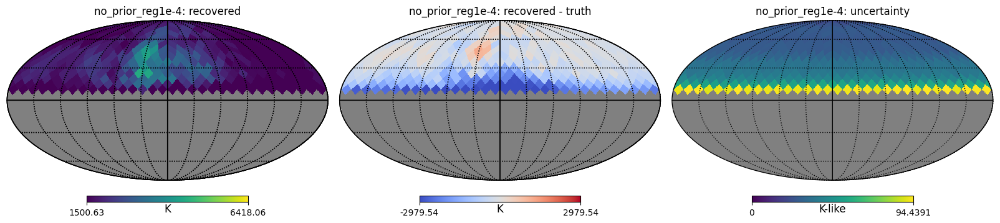


no_prior_reg1e-4
Recovered percentiles: [ 167.09482928  547.29144598 1799.37234054 3312.93380134 4169.44281242]
Residual percentiles: [-4980.86626644 -2979.54253449  -338.25577064   157.52094016
   649.96692333]
Uncertainty percentiles: [22.99858184 25.35689735 35.65476435 92.3987475  94.43907831]


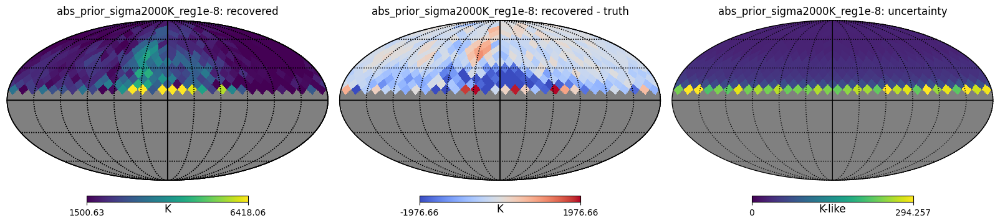


abs_prior_sigma2000K_reg1e-8
Recovered percentiles: [ 853.20108519 1285.37836409 1930.80904892 3950.73025528 6904.66017346]
Residual percentiles: [-3404.93295583 -1925.1866447   -277.55282402   311.42342221
  1506.13197494]
Uncertainty percentiles: [ 24.31143157  27.25919871  39.55110733 245.91983065 294.25690472]


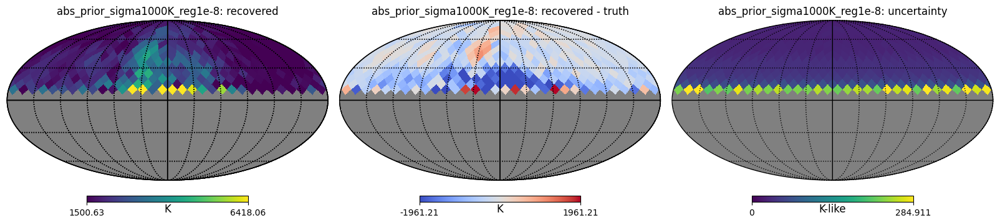


abs_prior_sigma1000K_reg1e-8
Recovered percentiles: [ 999.05381935 1284.99543646 1931.37260278 3954.3252817  6897.96444785]
Residual percentiles: [-3395.03443247 -1895.91065573  -276.91598282   307.59986715
  1466.22157739]
Uncertainty percentiles: [ 24.2830129   27.22280162  39.49905894 240.40459691 284.91079844]


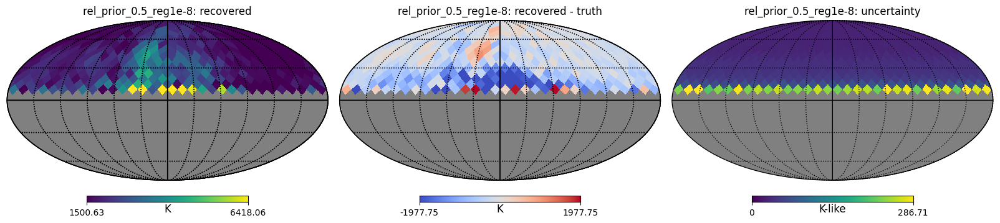


rel_prior_0.5_reg1e-8
Recovered percentiles: [ 878.08935228 1285.65065496 1930.38721684 3949.92510562 6904.70897191]
Residual percentiles: [-3407.58549645 -1925.48731798  -278.10767813   310.8923713
  1511.00308944]
Uncertainty percentiles: [ 24.2968603   27.25244832  39.52605427 244.53815923 286.7103095 ]


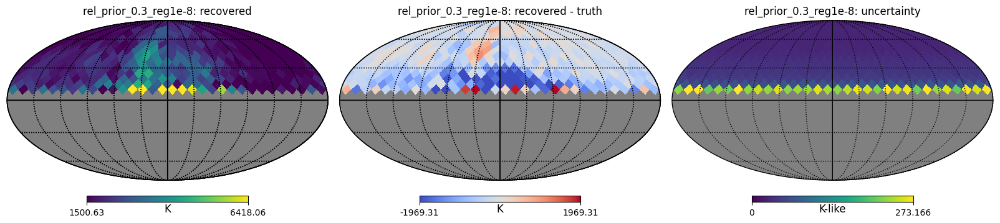


rel_prior_0.3_reg1e-8
Recovered percentiles: [1071.5469923  1285.25288711 1929.95448963 3950.81709532 6900.18946251]
Residual percentiles: [-3406.4829215  -1898.80278665  -277.1425421    311.11297266
  1495.28987349]
Uncertainty percentiles: [ 24.25717657  27.21920854  39.43171557 238.88505081 273.16583805]


In [23]:
# ============================================================
# RECOVERED / RESIDUAL / UNCERTAINTY SIDE BY SIDE
# Uses case["map"] and case["unc"]
# ============================================================

def plot_recovered_residual_uncertainty_case(
    case_name,
    truth_patch,
    recovery_cases,
    pix,
    nside,
    residual_percentile=95,
    uncertainty_percentile=99,
):
    case = recovery_cases[case_name]

    rec_patch = np.asarray(case["map"]).reshape(-1)
    unc_patch = np.asarray(case["unc"]).reshape(-1)
    truth_patch = np.asarray(truth_patch).reshape(-1)

    residual_patch = rec_patch - truth_patch

    rec_full = patch_to_full_map(rec_patch, pix, nside)
    res_full = patch_to_full_map(residual_patch, pix, nside)
    unc_full = patch_to_full_map(unc_patch, pix, nside)

    finite_truth = np.isfinite(truth_patch)
    vmin, vmax = np.nanpercentile(truth_patch[finite_truth], [1, 99])

    finite_res = np.isfinite(residual_patch)
    rmax = np.nanpercentile(np.abs(residual_patch[finite_res]), residual_percentile)

    finite_unc = np.isfinite(unc_patch)
    umax = np.nanpercentile(unc_patch[finite_unc], uncertainty_percentile)

    plt.figure(figsize=(16, 4.8))

    hp.mollview(
        rec_full,
        title=f"{case_name}: recovered",
        unit="K",
        min=vmin,
        max=vmax,
        sub=(1, 3, 1),
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        res_full,
        title=f"{case_name}: recovered - truth",
        unit="K",
        min=-rmax,
        max=rmax,
        cmap="coolwarm",
        sub=(1, 3, 2),
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        unc_full,
        title=f"{case_name}: uncertainty",
        unit="K-like",
        min=0,
        max=umax,
        sub=(1, 3, 3),
        badcolor="gray",
    )
    hp.graticule()

    plt.show()

    print(f"\n{case_name}")
    print("Recovered percentiles:", np.nanpercentile(rec_patch, [1, 5, 50, 95, 99]))
    print("Residual percentiles:", np.nanpercentile(residual_patch, [1, 5, 50, 95, 99]))
    print("Uncertainty percentiles:", np.nanpercentile(unc_patch, [1, 5, 50, 95, 99]))


# Compare against the prior reference truth, usually FWHM40
truth_patch = reference_patches[prior_ref_key]

for case_name in [
    "no_prior_reg1e-8",
    "no_prior_reg1e-4",
    "abs_prior_sigma2000K_reg1e-8",
    "abs_prior_sigma1000K_reg1e-8",
    "rel_prior_0.5_reg1e-8",
    "rel_prior_0.3_reg1e-8",
]:
    if case_name in recovery_cases:
        plot_recovered_residual_uncertainty_case(
            case_name=case_name,
            truth_patch=truth_patch,
            recovery_cases=recovery_cases,
            pix=pix,
            nside=MAP_NSIDE,
        )